# Progress Report

### Introduction to Data & Data Collection:

The project is based on Image denoising which is the process of taking away noise from an image. Information will be lost if there is an increase in noise. A digital camera's sensor illumination levels, damaged electrical circuits from heat, faulty memory locations in hardware, or bit errors during data transmission over long distances are a few examples of how noise can occur. Noise is when extra unnecessary pixel values are added to an image, resulting in the loss of information. We have obtained a dataset from University of California Berkeley in order to denoise the image.

The dataset we are studying is found at,

Data-https://github.com/BIDS/BSDS500 

This Dataset  consists of 500 natural images.

We plan to answer the following questions-
1. How can we remove blind noise from images?
2. How can we boost picture processing efficiency?
3. How can we enhance photos taken in poor light?
4. How do we restore old photos/documents?

### Any changes:
The scope has not changed since the check-in proposal slides.

Noises are present in the real-world photos that are photographed. These noises may emerge for a variety of causes, including unstable electric signals, broken camera sensors, dim illumination, lost data during long-distance data transmission, etc. As a result of noise, the original pixel values are sometimes replaced by random values, which can reduce the quality of the acquired image and result in information loss. Therefore, when it comes to low-level vision tasks and image processing, it is necessary to eliminate these noises from pictures.


### Data:
For our problem set,we need clean images, first we collected high quality images from random sources -
1. Smartphone Image Denoising Dataset (SIDD)
2. Real Low-Light Image Noise Reduction Dataset (RENOIR)
3. NIND -Natural Image Noise Dataset
4. University of california berkeley Segmentation Data Set and Benchmarks 500 (BSDS500)

There were four distinct kinds of datasets gathered; the BSDS500 dataset had 500 natural photos, all of which were of good quality. Of the 500 photos, we divided them into 400 train images and 100 test images.then we create patches for each image,We will split each of these images into small patches.because, splitting images into patches and using these patches for training improve model performance in denoising.

Then also the images in the dataset are of different sizes,we resize each image in the dataset to equal sizes for each image, patches of 40*40 pixels, 40-stride height, and various crop sizes are created.
Since there are 500 total pictures in the dataset, there will be around 85000 patches for training and 21000 patches for the data.


### Exploratory data analysis:

In [46]:
import os
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from cv2 import imshow as imshow
import random
import numpy as np
import math
import matplotlib.image as mpimg
import glob
from patchify import patchify, unpatchify
from sklearn.model_selection import train_test_split
import pickle
from tqdm import tqdm
import tensorflow as tf
from tensorflow.keras.callbacks import LearningRateScheduler,ReduceLROnPlateau
from tensorflow.keras import models, layers
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, BatchNormalization, Activation, Flatten, Dense, Input, MaxPooling2D, Add, Reshape, concatenate, AveragePooling2D, Multiply, GlobalAveragePooling2D, UpSampling2D, MaxPool2D,Softmax
from tensorflow.keras.activations import softmax
from tensorflow.keras import initializers, regularizers
from tensorflow.keras.optimizers import Adam
import skimage.color
import skimage.io
import imageio as iio
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from PIL import Image

In [48]:
def add_gaussian_blur(data):
    dst = cv2.GaussianBlur(data, (35, 35), cv2.BORDER_DEFAULT)
    return dst

def add_gaussian_noise(data):
    mean = (10, 10, 10)
    std = (50, 50, 50)
    row, col, channel = data.shape
    noise = np.random.normal(mean, std, (row, col, channel)).astype('uint8')
    return data + noise
def patches(img,patch_size):
    patches = patchify(img, (patch_size, patch_size, 3), step=patch_size)
    return patches

def load_images_from_folder(folder):
    images = []
    sizes=[]
    fname=[]
    for filename in os.listdir(folder):
        fname.append(filename)
        img = cv2.imread(os.path.join(folder,filename))
        if img is not None:
            images.append(img)
            sizes.append(img.shape)
    return fname,images,sizes

In [51]:
f,k,s= load_images_from_folder('C:/Users/bjanja2/Desktop/BSDS500-master/BSDS500/data/images/train/')
df = pd.DataFrame()
df['filename']=f[:200]
noised_data=[]

df['ground_truth']=k
for i in k:
    g=add_gaussian_blur(i)
    n=add_gaussian_noise(g)
    noised_data.append(n)

df['noised_images']=noised_data
df['size']=s
df['size'].astype(str)

0      (321, 481, 3)
1      (481, 321, 3)
2      (321, 481, 3)
3      (321, 481, 3)
4      (481, 321, 3)
           ...      
195    (321, 481, 3)
196    (481, 321, 3)
197    (321, 481, 3)
198    (321, 481, 3)
199    (321, 481, 3)
Name: size, Length: 200, dtype: object

In [54]:
# My cpu was unable to handle this
fig = plt.figure(figsize = ( 400, 200))
df.shape
y = list(df['size'].value_counts())
print("y",y)
x1 = df['size'].value_counts().index.tolist()
x=x1[1]
x=x[:2]
print("x",x)
plt.bar(x,y)
plt.title("Images vs Size")
plt.xlabel("Size of images")
plt.ylabel("No. of images")

y [137, 63]
x (481, 321)


Text(0, 0.5, 'No. of images')

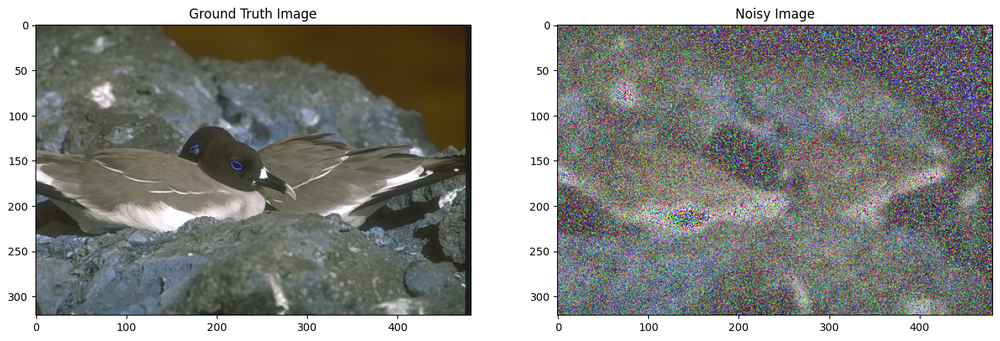

In [53]:
img = mpimg.imread('C:/Users/bjanja2/Desktop/BSDS500-master/BSDS500/data/images/train/'+df.iloc[3][0])
fig, axes = plt.subplots(1,2,figsize=(16, 16))
axes[0].imshow(df.iloc[3][1])
axes[0].set_title('Ground Truth Image')
axes[1].imshow(df.iloc[3][2])
axes[1].set_title('Noisy Image')
plt.show()

In [56]:
#Creating patches for Ground Truth Image
random_gt_path = df.iloc[3][0]
img = cv2.imread('C:/Users/bjanja2/Desktop/BSDS500-master/BSDS500/data/images/train/'+random_gt_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
print('Image shape: {}'.format(img.shape))
patches_gt = patches(img,50)
print('Patch shape: {}'.format(patches_gt.shape))

Image shape: (321, 481, 3)
Patch shape: (6, 9, 1, 50, 50, 3)


In [57]:
#Creating patches for a Noisy Image
img = df.iloc[3][2]
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
print('Image shape: {}'.format(img.shape))

patches_nsy = patches(img,50)
print('Patch shape: {}'.format(patches_nsy.shape))

Image shape: (321, 481, 3)
Patch shape: (6, 9, 1, 50, 50, 3)


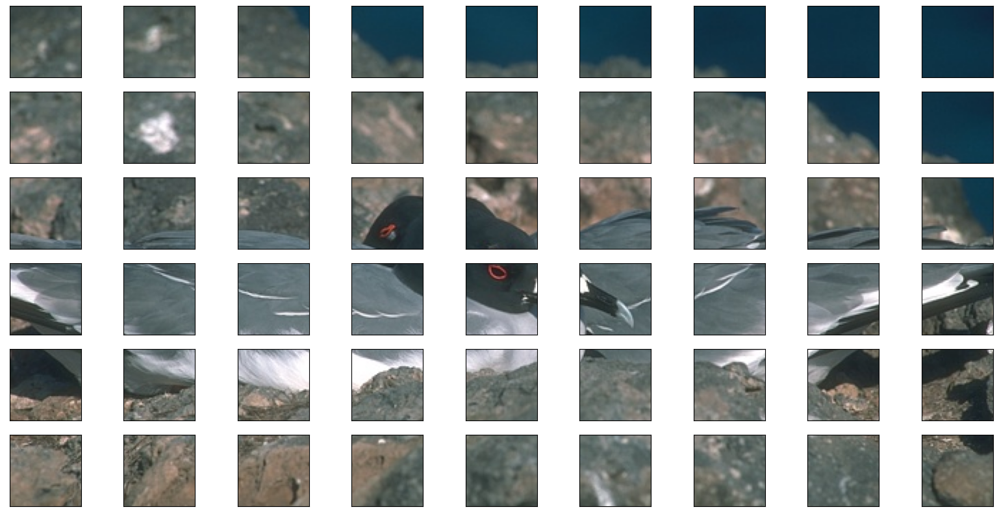

In [58]:
rows = patches_nsy.shape[0]
cols = patches_nsy.shape[1]
fig, axs = plt.subplots(rows,cols,figsize=(20,10))
for i in range(rows):
    for j in range(cols):
        axs[i][j].imshow(patches_gt[i][j][0])
        axs[i][j].get_xaxis().set_visible(False)
        axs[i][j].get_yaxis().set_visible(False)

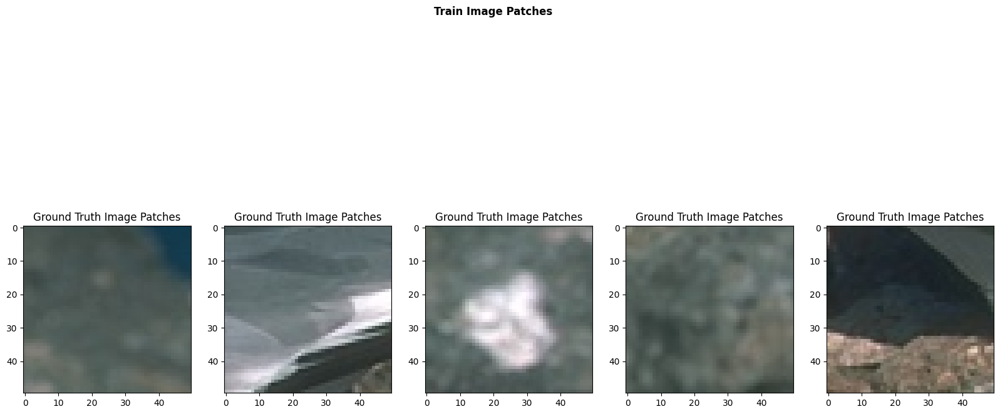

In [59]:
fig, axs = plt.subplots(1,5,figsize=(20,10))
r = random.sample(range(0, rows), 5)
c = random.sample(range(0, cols), 5)
fig.suptitle('Train Image Patches',fontweight ="bold")
for i in range(5):
    axs[i].imshow(patches_gt[r[i]][c[i]][0])
    axs[i].set_title('Ground Truth Image Patches')

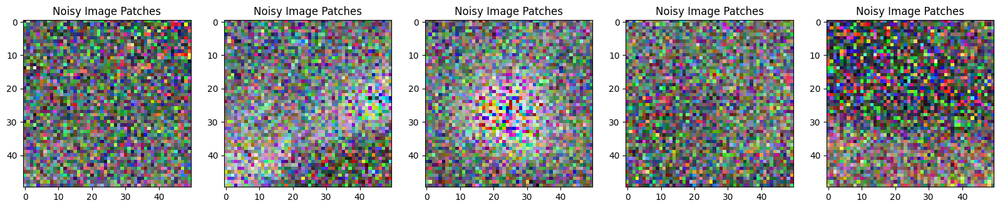

In [60]:
fig, axs = plt.subplots(1,5,figsize=(20,10))
for i in range(5):
    axs[i].imshow(patches_nsy[r[i]][c[i]][0])
    axs[i].set_title('Noisy Image Patches')

In [61]:
mean_red_gt = []
mean_blue_gt = []
mean_green_gt = []
mean_red_nsy = []
mean_blue_nsy = []
mean_green_nsy = []
for i in df['ground_truth']:
    img = i
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    mean_red_gt.append(np.mean(img[:,:,0]))
    mean_green_gt.append(np.mean(img[:,:,1]))
    mean_blue_gt.append(np.mean(img[:,:,2]))

for j in df['noised_images']:
    img = j
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    mean_red_nsy.append(np.mean(img[:,:,0]))
    mean_green_nsy.append(np.mean(img[:,:,1]))
    mean_blue_nsy.append(np.mean(img[:,:,2]))

In [62]:
red_gt = pd.DataFrame()
green_gt = pd.DataFrame()
blue_gt = pd.DataFrame()
red_nsy = pd.DataFrame()
green_nsy = pd.DataFrame()
blue_nsy = pd.DataFrame()

red_gt['Mean Pixel on Ground Truth Images'] = mean_red_gt
red_gt['channel'] = 'red'
red_nsy['Mean Pixel on  Noisy Images'] = mean_red_nsy
red_nsy['channel'] = 'red'

green_gt['Mean Pixel on Ground Truth Images'] = mean_green_gt
green_gt['channel'] = 'green'
green_nsy['Mean Pixel on  Noisy Images'] = mean_green_nsy
green_nsy['channel'] = 'green'

blue_gt['Mean Pixel on Ground Truth Images'] = mean_blue_gt
blue_gt['channel'] = 'blue'
blue_nsy['Mean Pixel on  Noisy Images'] = mean_blue_nsy
blue_nsy['channel'] = 'blue'

concat_gt = pd.concat([red_gt,green_gt,blue_gt],ignore_index=True)
concat_nsy = pd.concat([red_nsy,green_nsy,blue_nsy],ignore_index=True)

C:\Users\bjanja2\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\axisgrid.py:848: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  func(*plot_args, **plot_kwargs)
C:\Users\bjanja2\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\axisgrid.py:848: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457

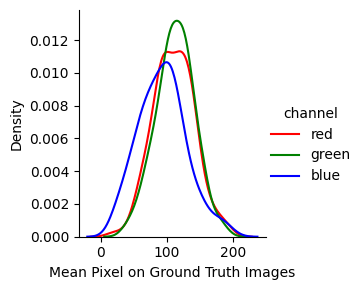

In [64]:
color = {'color': ['r', 'g', 'b']}
sns.FacetGrid(concat_gt,hue='channel',hue_kws=color).map(sns.distplot,'Mean Pixel on Ground Truth Images',hist=False).add_legend()

C:\Users\bjanja2\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\axisgrid.py:848: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  func(*plot_args, **plot_kwargs)
C:\Users\bjanja2\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\axisgrid.py:848: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457

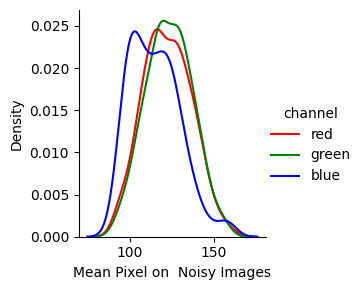

In [65]:
sns.FacetGrid(concat_nsy,hue='channel',hue_kws=color).map(sns.distplot,'Mean Pixel on  Noisy Images',hist=False).add_legend()


C:\Users\bjanja2\AppData\Local\Temp\ipykernel_14776\3372376309.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(mean_red_gt,ax=axes[0][1],hist=False,color='r')
C:\Users\bjanja2\AppData\Local\Temp\ipykernel_14776\3372376309.py:9: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(

Text(0.5, 0, 'Mean Pixels')

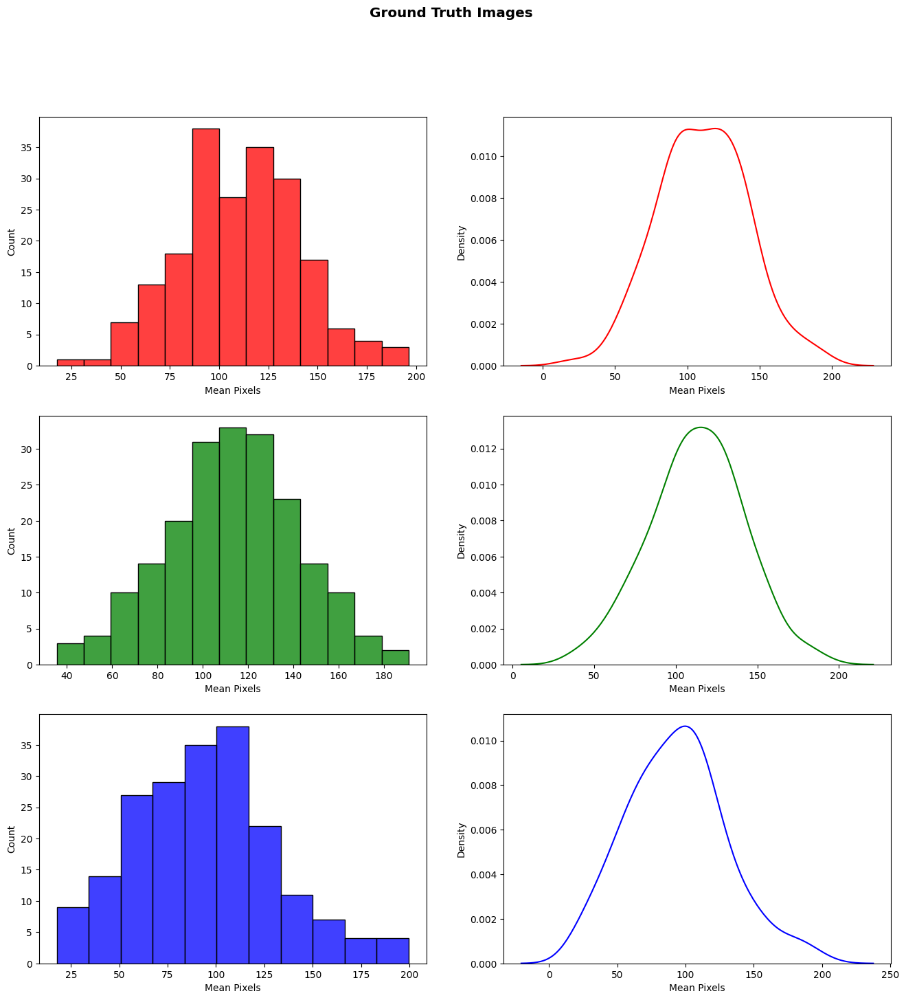

In [66]:
fig, axes = plt.subplots(3,2,figsize=(16, 16))
fig.suptitle("Ground Truth Images", fontsize = 'x-large' , fontweight = 'bold' )
sns.histplot(mean_red_gt,ax=axes[0][0],color='r')
sns.distplot(mean_red_gt,ax=axes[0][1],hist=False,color='r')
axes[0][0].set_xlabel('Mean Pixels')
axes[0][1].set_xlabel('Mean Pixels')

sns.histplot(mean_green_gt,ax=axes[1][0],color='g')
sns.distplot(mean_green_gt,ax=axes[1][1],hist=False,color='g')
axes[1][0].set_xlabel('Mean Pixels')
axes[1][1].set_xlabel('Mean Pixels')

sns.histplot(mean_blue_gt,ax=axes[2][0],color='b')
sns.distplot(mean_blue_gt,ax=axes[2][1],hist=False,color='b')
axes[2][0].set_xlabel('Mean Pixels')
axes[2][1].set_xlabel('Mean Pixels')

C:\Users\bjanja2\AppData\Local\Temp\ipykernel_14776\3322910416.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(mean_red_nsy,ax=axes[0][1],hist=False,color='r')
C:\Users\bjanja2\AppData\Local\Temp\ipykernel_14776\3322910416.py:9: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot

Text(0.5, 0, 'Mean Pixels')

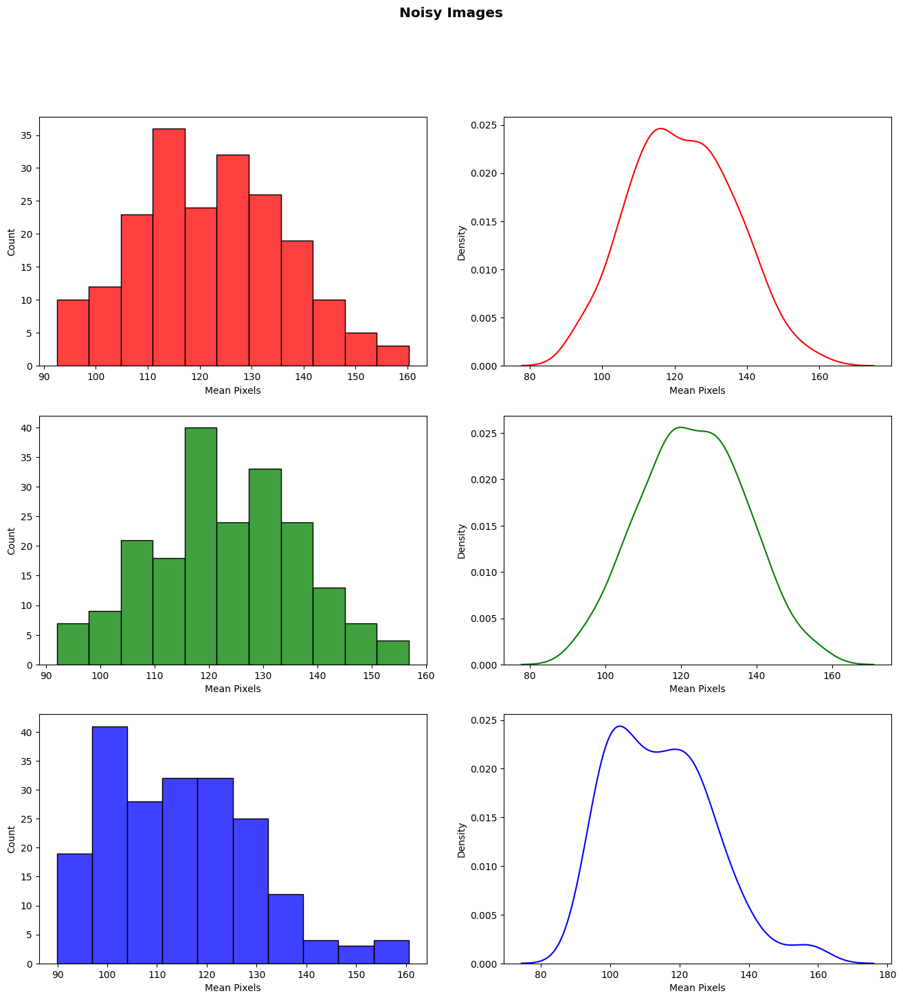

In [67]:
fig, axes = plt.subplots(3,2,figsize=(16, 16))
fig.suptitle("Noisy Images", fontsize = 'x-large' , fontweight = 'bold' )
sns.histplot(mean_red_nsy,ax=axes[0][0],color='r')
sns.distplot(mean_red_nsy,ax=axes[0][1],hist=False,color='r')
axes[0][0].set_xlabel('Mean Pixels')
axes[0][1].set_xlabel('Mean Pixels')

sns.histplot(mean_green_nsy,ax=axes[1][0],color='g')
sns.distplot(mean_green_nsy,ax=axes[1][1],hist=False,color='g')
axes[1][0].set_xlabel('Mean Pixels')
axes[1][1].set_xlabel('Mean Pixels')

sns.histplot(mean_blue_nsy,ax=axes[2][0],color='b')
sns.distplot(mean_blue_nsy,ax=axes[2][1],hist=False,color='b')
axes[2][0].set_xlabel('Mean Pixels')
axes[2][1].set_xlabel('Mean Pixels')

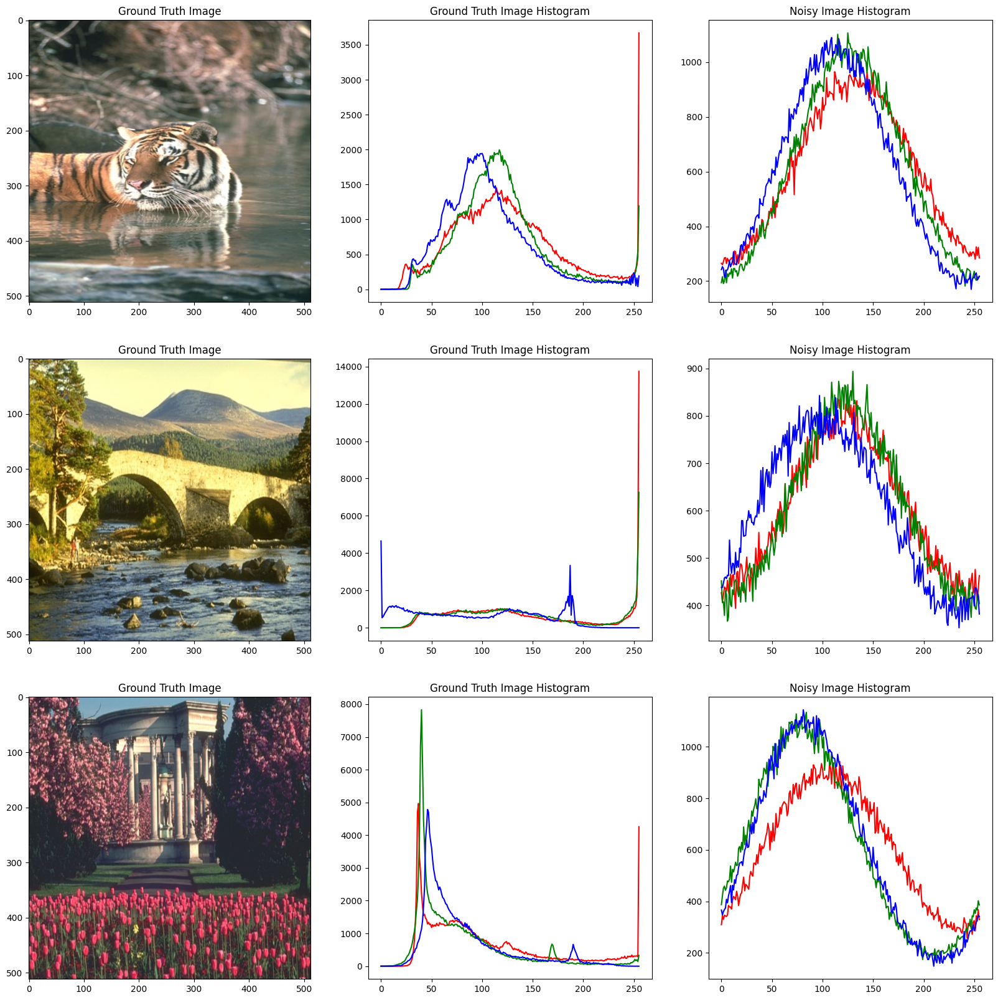

In [68]:
sample_ground_truth=[df.iloc[9][1],df.iloc[99][1],df.iloc[198][1]]
sample_noisy=[df.iloc[9][2],df.iloc[99][2],df.iloc[198][2]]
fig, axes = plt.subplots(len(sample_ground_truth),3,figsize=(20, 20))
for i in range(len(sample_ground_truth)):
    img = sample_ground_truth[i]
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    resized_img = cv2.resize(img,(512,512))
    axes[i][0].imshow(resized_img)
    axes[i][0].set_title('Ground Truth Image')
    axes[i][1].plot(cv2.calcHist([img],[0],None,[256],[0,256]),color='r')
    axes[i][1].plot(cv2.calcHist([img],[1],None,[256],[0,256]),color='g')
    axes[i][1].plot(cv2.calcHist([img],[2],None,[256],[0,256]),color='b')
    axes[i][1].set_title('Ground Truth Image Histogram')

    img = sample_noisy[i]
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axes[i][2].plot(cv2.calcHist([img],[0],None,[256],[0,256]),color='r')
    axes[i][2].plot(cv2.calcHist([img],[1],None,[256],[0,256]),color='g')
    axes[i][2].plot(cv2.calcHist([img],[2],None,[256],[0,256]),color='b')
    axes[i][2].set_title('Noisy Image Histogram')

In [69]:
SSIM = [];PSNR = [];
for i in tqdm(range(len(df))):
    img1 = df.iloc[i][1]
    img1 = img1.astype("float32") / 255.0
    img2 = df.iloc[i][2]
    img2 = img2.astype("float32") / 255.0
    SSIM.append(ssim(img1,img2,multichannel=True,data_range=img2.max() - img2.min()))
    PSNR.append(psnr(img1,img2))

  0%|                                                                                          | 0/200 [00:00<?, ?it/s]C:\Users\bjanja2\AppData\Local\Temp\ipykernel_14776\1905230392.py:7: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  SSIM.append(ssim(img1,img2,multichannel=True,data_range=img2.max() - img2.min()))
100%|████████████████████████████████████████████████████████████████████████████████| 200/200 [00:06<00:00, 30.27it/s]


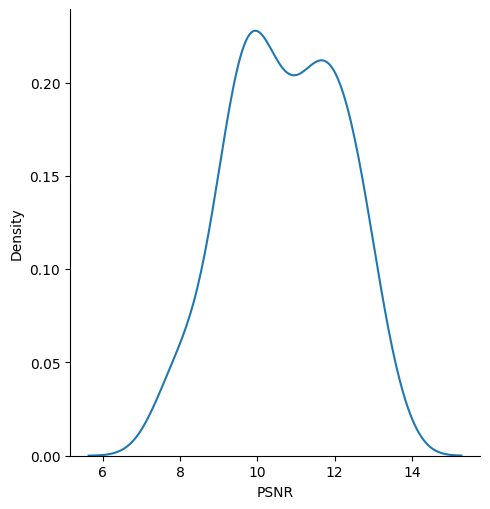

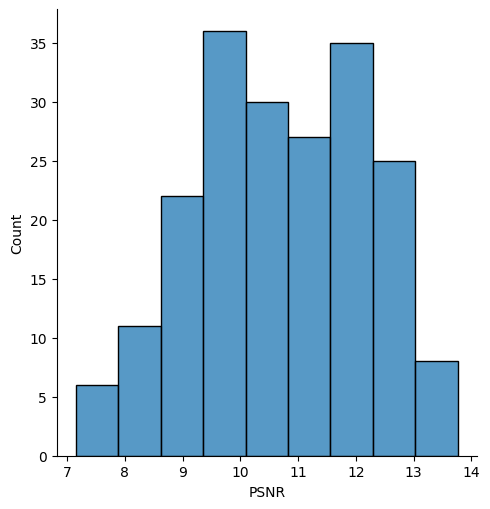

In [70]:
ax = sns.displot(PSNR,kind='kde')
ax.set(xlabel='PSNR', ylabel='Density')
ax = sns.displot(PSNR)
ax.set(xlabel='PSNR', ylabel='Count')

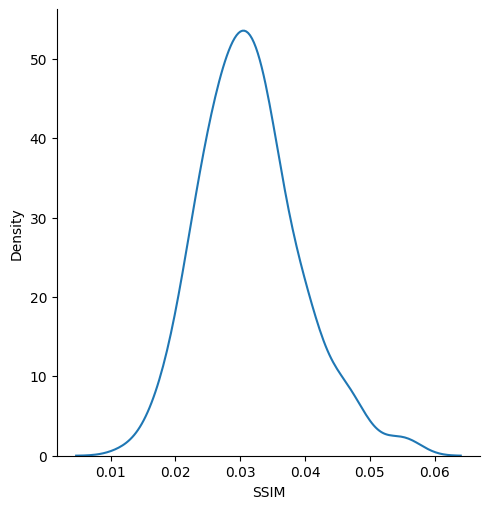

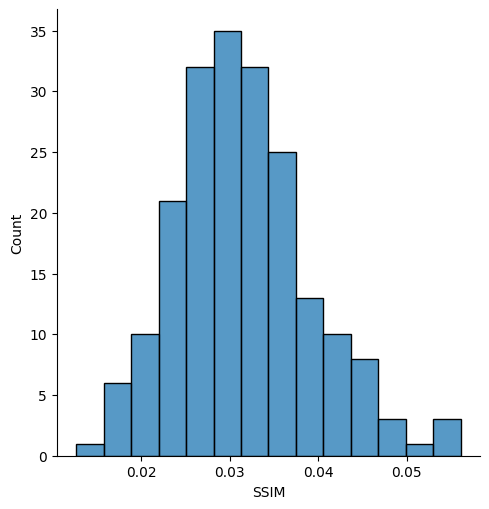

In [71]:
ax = sns.displot(SSIM,kind='kde')
ax.set(xlabel='SSIM', ylabel='Density')
ax = sns.displot(SSIM)
ax.set(xlabel='SSIM', ylabel='Count')

### Visualization:

In [2]:
import numpy as np
import os
import cv2
import tensorflow as tf
import keras
import matplotlib.pyplot as plt

In [4]:
test_load = os.listdir("C:/Users/bjanja2/Desktop/Test - Visualization/")

#Replace Test Data Direcctory
# Test Data Link: https://github.com/bavya-sri/Rasmalai/tree/main/Test%20Visualisation

x_test =[]

for image in test_load:
  img = cv2.imread("C:/Users/bjanja2/Desktop/Test - Visualization/"+image)
  if img is not None:
    img = cv2.resize(img, [300,300], interpolation = cv2.INTER_AREA)
    x_test.append(img)


In [5]:
x_test = np.array(x_test)
noise_factor = 35
x_test_noisy = x_test + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=x_test.shape) 
x_test_noisy.shape

(4, 300, 300, 3)

In [6]:
def PSNR(gt, image, max_value=1):
    """"Function to calculate peak signal-to-noise ratio (PSNR) between two images."""
    height, width , channels= gt.shape
    mse = np.mean((gt - image) ** 2)
    if mse == 0:
        return 100
    return 20 * np.log10(max_value / (np.sqrt(mse)))

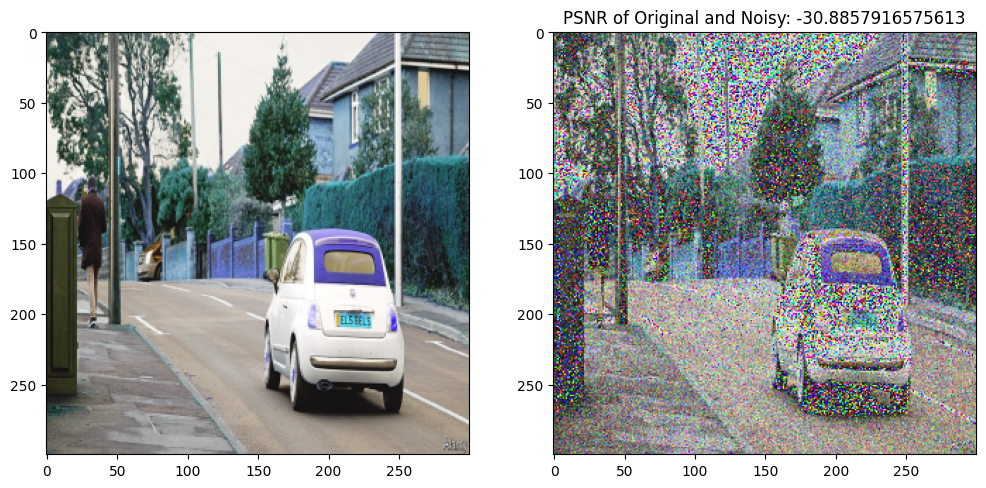

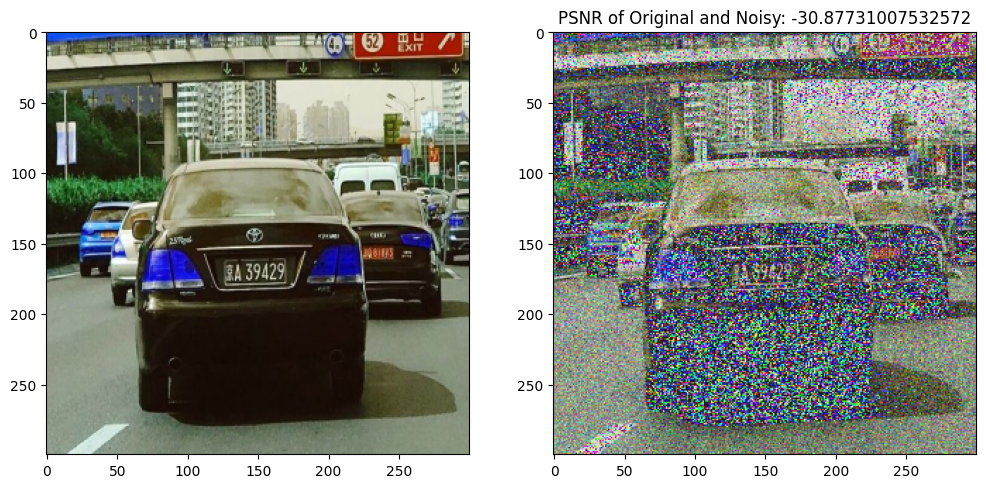

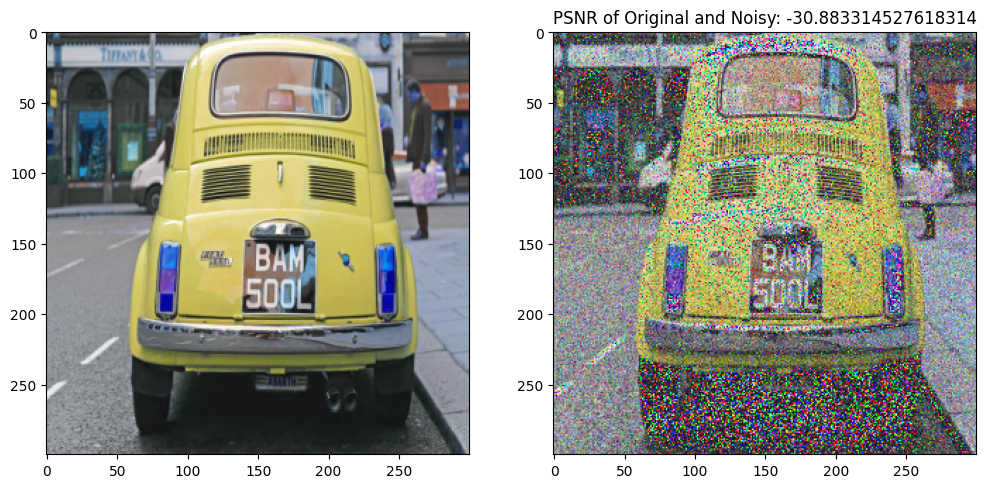

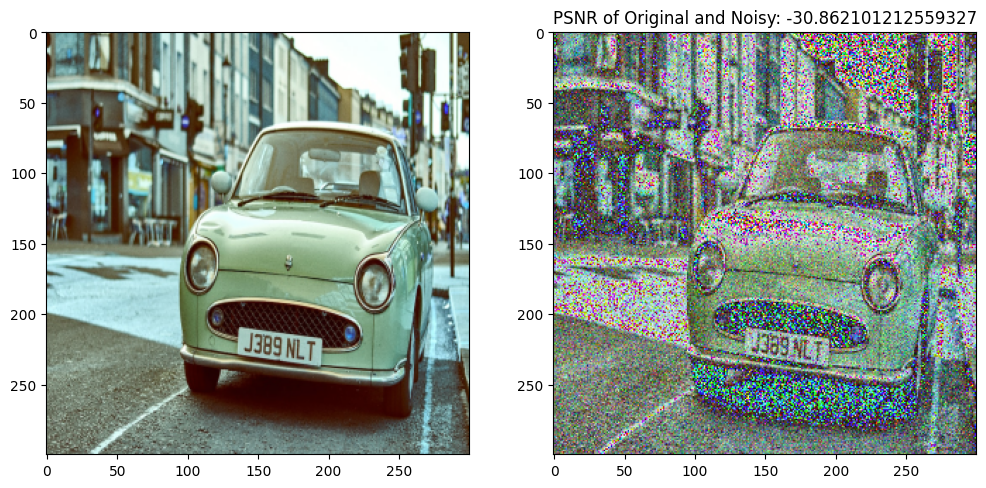

In [7]:
for i in range(0,4):
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,12))
  plt.title(f'PSNR of Original and Noisy: {PSNR(x_test[i], x_test_noisy[i])}')
  ax1.imshow(x_test[i])
  ax2.imshow(x_test_noisy[i].astype('uint8'))
  plt.show()

Quite often we find ourselves in a situation where we encounter an unclear image with a lot of noise, which may hide valuable information or data. In many cases this information can be lost due to these inaccurate noisy images and may lead to wrong decisions or false judgement. Therefore, denoising of images are necessary while trying to make a decision on the basis of an image output. Noisy images are a common occurrence in Number Plate detection, predicting skin disease, fingerprint detection, e.t.c...

For Example, let us consider the Number Plate Detection of cars. Pictures taken by CCTV can be blury, or may be added with some random noise. Here, left side of the plot shows Original images and right one shows the noisy image. Running number plate detection model on these noisy images can give the inaccurate results. So, the denoising of these images is manidatory to avoid false decisions.

### ML analysis:

 a) AutoEncoder

In [8]:
import numpy as np
import os
import cv2
import tensorflow as tf
import keras
import matplotlib.pyplot as plt

In [11]:
x_test =[]
x_train = []
test_url = "C:/Users/bjanja2/Desktop/BSDS500-master/BSDS500/data/images/test/"
train_url = "C:/Users/bjanja2/Desktop/BSDS500-master/BSDS500/data/images/train/"

test_load = os.listdir(test_url)
train_load = os.listdir(train_url)


for image in test_load:
  img = cv2.imread(test_url+image)
  if img is not None:
    img = cv2.resize(img, [300,300], interpolation = cv2.INTER_AREA)
    x_test.append(img)

for image in train_load:
  img = cv2.imread(train_url+image)

  if img is not None:
    img = cv2.resize(img, [300,300], interpolation = cv2.INTER_AREA)
    x_train.append(img)

In [12]:
x_test = np.array(x_test)
x_train = np.array(x_train)
print(x_test.shape, x_train.shape)

(200, 300, 300, 3) (200, 300, 300, 3)


In [13]:
def PSNR(gt, image, max_value=1):
    height, width , channels= gt.shape
    mse = np.mean((gt - image) ** 2)
    if mse == 0:
        return 100
    return 20 * np.log10(max_value / (np.sqrt(mse)))

In [14]:
def get_patches(image):
    image=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
    height, width , channels= image.shape
    crop_sizes=[1]
    patch_size=40
    patches = []
    for crop_size in crop_sizes: #We will crop the image to different sizes
        crop_h, crop_w = int(height*crop_size),int(width*crop_size)
        image_scaled = cv2.resize(image, (crop_w,crop_h), interpolation=cv2.INTER_CUBIC)
        for i in range(0, crop_h-patch_size+1, int(patch_size/1)):
            for j in range(0, crop_w-patch_size+1, int(patch_size/1)):
              x = image_scaled[i:i+patch_size, j:j+patch_size] # This gets the patch from the original image with size patch_size x patch_size
              patches.append(x)
    return patches



def create_image_from_patches(patches,image_shape):
  image=np.zeros(image_shape) # Create a image with all zeros with desired image shape
  patch_size=patches.shape[1]
  p=0
  for i in range(0,image.shape[0]-patch_size+1,int(patch_size/1)):
    for j in range(0,image.shape[1]-patch_size+1,int(patch_size/1)):
      image[i:i+patch_size,j:j+patch_size]=patches[p] # Assigning values of pixels from patches to image
      p+=1
  return np.array(image)
  
def get_image(gt,noise_level):
  patches=get_patches(gt)
  height, width , channels= gt.shape
  test_image=cv2.resize(gt, (width//40*40,height//40*40), interpolation=cv2.INTER_CUBIC)
  patches=np.array(patches)
  ground_truth=create_image_from_patches(patches,test_image.shape)

  #predicting the output on the patches of test image
  patches = patches.astype('float32') / 255.
  patches_noisy = patches+ tf.random.normal(shape=patches.shape,mean=0,stddev=noise_level/255) 
  patches_noisy = tf.clip_by_value(patches_noisy, clip_value_min=0., clip_value_max=1.)
  noisy_image=create_image_from_patches(patches_noisy,test_image.shape)
  
  return ground_truth/255.,noisy_image,patches_noisy

In [18]:
def create_model():
  x = keras.Input(shape=(280, 280, 3))
  e_conv1 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
  pool1 = tf.keras.layers.MaxPooling2D((2, 2), padding='same')(e_conv1)
  batchnorm_1 = tf.keras.layers.BatchNormalization()(pool1)
  e_conv2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(batchnorm_1)
  pool2 = tf.keras.layers.MaxPooling2D((2, 2), padding='same')(e_conv2)
  batchnorm_2 = tf.keras.layers.BatchNormalization()(pool2)
  e_conv3 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', padding='same')(batchnorm_2)
  h = tf.keras.layers.MaxPooling2D((2, 2), padding='same')(e_conv3)
  d_conv1 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(h)
  up1 = tf.keras.layers.UpSampling2D((2, 2))(d_conv1)
  d_conv2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(up1)
  up2 = tf.keras.layers.UpSampling2D((2, 2))(d_conv2)
  d_conv3 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', padding='same')(up2)
  up3 = tf.keras.layers.UpSampling2D((2, 2))(d_conv3)
  r = tf.keras.layers.Conv2D(3, (3, 3), activation='sigmoid', padding='same')(up3)
  model = keras.Model(x, r)
  model.compile(optimizer='adam', loss='mse')
  return model


In [19]:
noisy_data = []
train_data = []
for img in x_train:
  gt, noisy, patches_noisy = get_image(img, 50)
  noisy_data.append(noisy)
  train_data.append(gt)
noisy_data = np.array(noisy_data)
train_data = np.array(train_data)

In [26]:
auto_encoder = create_model()
auto_encoder.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 280, 280, 3)]     0         
                                                                 
 conv2d_7 (Conv2D)           (None, 280, 280, 64)      1792      
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 140, 140, 64)     0         
 2D)                                                             
                                                                 
 batch_normalization_2 (Batc  (None, 140, 140, 64)     256       
 hNormalization)                                                 
                                                                 
 conv2d_8 (Conv2D)           (None, 140, 140, 32)      18464     
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 70, 70, 32)       0   

In [27]:
auto_encoder.fit(noisy_data, train_data, epochs=100, batch_size=32, callbacks=[])

Epoch 1/100
7/7 [==============================] - 40s 5s/step - loss: 0.0580
Epoch 2/100
7/7 [==============================] - 34s 5s/step - loss: 0.0219
Epoch 3/100
7/7 [==============================] - 34s 5s/step - loss: 0.0172
Epoch 4/100
7/7 [==============================] - 34s 5s/step - loss: 0.0154
Epoch 5/100
7/7 [==============================] - 33s 5s/step - loss: 0.0146
Epoch 6/100
7/7 [==============================] - 33s 5s/step - loss: 0.0128
Epoch 7/100
7/7 [==============================] - 34s 5s/step - loss: 0.0129
Epoch 8/100
7/7 [==============================] - 33s 5s/step - loss: 0.0126
Epoch 9/100
7/7 [==============================] - 33s 5s/step - loss: 0.0123
Epoch 10/100
7/7 [==============================] - 33s 5s/step - loss: 0.0108
Epoch 11/100
7/7 [==============================] - 33s 5s/step - loss: 0.0109
Epoch 12/100
7/7 [==============================] - 33s 5s/step - loss: 0.0105
Epoch 13/100
7/7 [==============================] - 33s 5s/st

In [22]:
noisy_test_data = []
test_data = []
for img in x_test:
  gt, noisy, patches_noisy = get_image(img, 50)
  noisy_test_data.append(noisy)
  test_data.append(gt)

In [28]:
noisy_test_data = np.array(noisy_test_data)
test_data = np.array(test_data)

In [29]:
predicted = auto_encoder(test_data)
predicted = predicted.numpy()

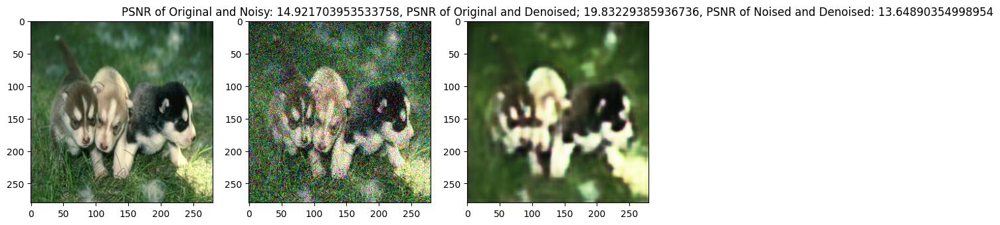

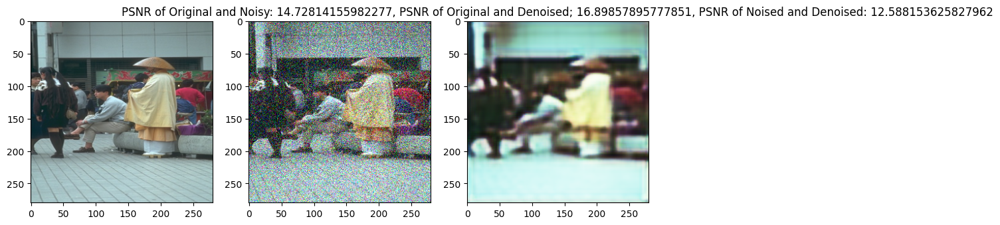

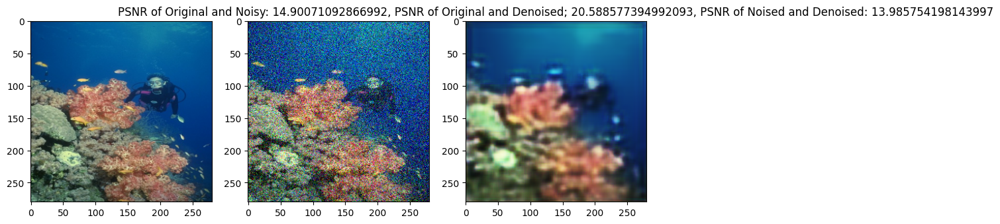

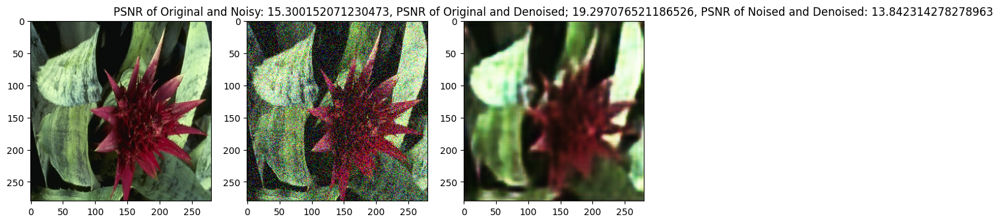

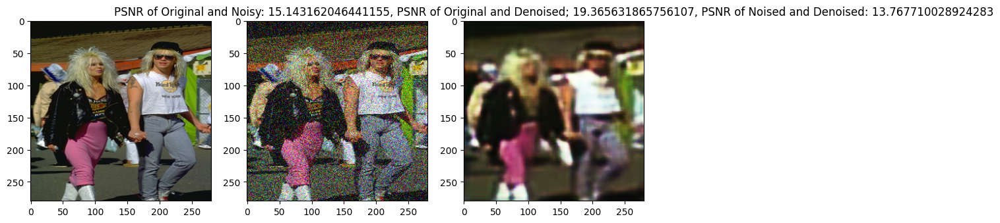

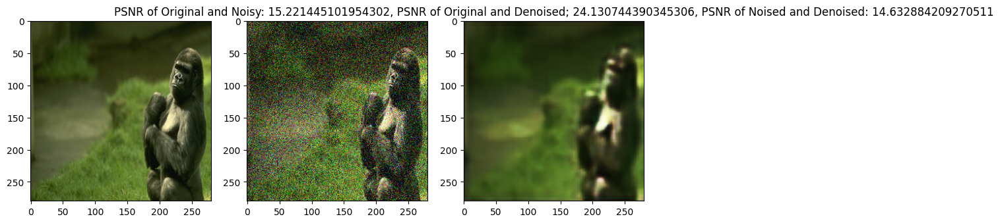

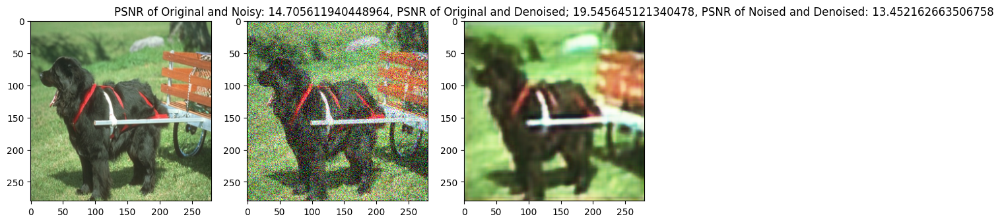

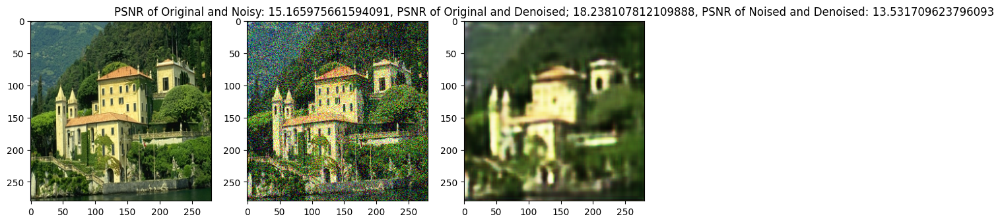

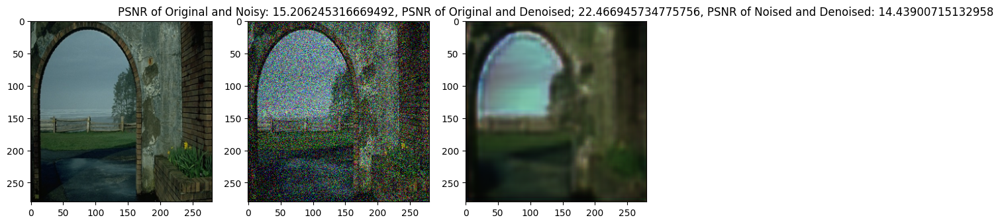

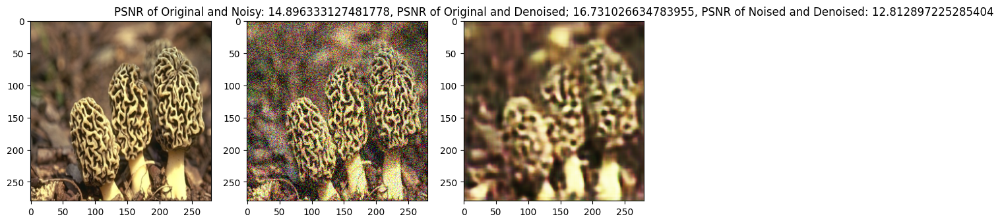

In [30]:
idxs = np.random.randint(0, 200, 10)
for img in zip(test_data[idxs], noisy_test_data[idxs], predicted[idxs]):
  fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12,12))
  plt.title(f'PSNR of Original and Noisy: {PSNR(img[0],img[1])}, PSNR of Original and Denoised; {PSNR(img[0],img[2])}, PSNR of Noised and Denoised: {PSNR(img[1],img[2])}')
  ax1.imshow(img[0])
  ax2.imshow(img[1])
  ax3.imshow(img[2])
  plt.show()

b) Median Blur

In [32]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import random

In [33]:
path = r'C:\Users\bjanja2\Desktop\Test - Visualization\istockphoto-1057895398-612x612.jpg'
img = cv2.imread(path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

In [34]:
noisy = np.zeros(img.shape, np.uint8)

In [35]:
p = 0.6

#traversing throughout the image pixels
for i in range(img.shape[0]): #rows
    for j in range(img.shape[1]): #cols
        r = random.random()
        if r < p / 2:
            noisy[i][j] = [0, 0, 0] #black noise
        elif r < p:
            noisy[i][j] = [255, 255, 255] #white noise
        else:
            noisy[i][j] = img[i][j] #original image pixel

In [36]:
# median blur
denoised = cv2.medianBlur(noisy, 5)

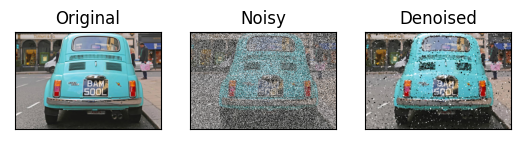

In [37]:
output = [img, noisy, denoised]

titles = ['Original', 'Noisy', 'Denoised']

for i in range(3):
    plt.subplot(1, 3, i + 1)
    plt.imshow(output[i])
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])
plt.show()

### Reflection:

The most challenging part of the project was collecting the dataset as initially we found images from different datasets from various sources. In a few datasets, images were taken from mobile phones while few other datasets contained images taken from DSLR cameras and also had limited images. Inorder to get higher accuracy we had to choose BSDS500 as it consisted of more than 500 images.
In the preliminary analysis we observed that we need more images in order to get more accuracy from our noisy images. Also when the level of noise is too high, the model fails to provide good results. 

Are there any concrete results you can show at this point? If not, why not?


Our biggest problems continue to be hardware, as well as figuring out appropriate algorithms to conduct analyses with.
We believe we are on track to finish this project by the end of the semester,and we are having a plan to build a web application of the model and this is definitely worth proceeding with.

Given your initial exploration of the data, is it worth proceeding with your project, why? If not, how will you move forward (method, data etc)?



### Next steps:
Going forward, we're looking to denoise the images with higher accuracy. Ideally, we're planning on completing one or two a week, which should allow us to hit the deadline.